# Notebook to plot comparisons of prediction jitter when animals are not moving. 

We took 4 of the the videos from the independent test dataset (1 ms exposure, at 4 different resolutions) and defined manually time intervals where fish were immobile to evaluate tracking jitter. 

`.\RES-1-EXPOSURE-1000\CLAS-Batch-2-Trial-6-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-10-4-10_well_1.avi` 

`.\RES-1-EXPOSURE-3000\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_6.avi`

`.\RES-2-EXPOSURE-1000\CLAS-Batch-6-Trial-2-FPS-200-GAIN-2-EXPOSURE-1000-RES-2-STIM-FLASH--2024-9-3-13-40-43_well_7.avi` 

`.RES-2-EXPOSURE-3000\CLAS-Batch-7-Trial-3-FPS-200-GAIN-0-EXPOSURE-3000-RES-2-STIM-FLASH--2024-9-3-13-55-59_well_1.avi` 

`.\RES-3-EXPOSURE-1000\CLAS-Batch-9-Trial-2-FPS-200-GAIN-2-EXPOSURE-1000-RES-3-STIM-FLASH--2024-9-3-14-51-25_well_3.avi` 

`.\RES-3-EXPOSURE-3000\CLAS-Batch-9-Trial-3-FPS-200-GAIN-0-EXPOSURE-3000-RES-3-STIM-FLASH--2024-9-3-15-8-2_well_3.avi` 

`.\RES-4-EXPOSURE-1000\CLAS-Batch-12-Trial-1-FPS-200-GAIN-2-EXPOSURE-1000-RES-4-STIM-FLASH--2024-9-3-16-6-30_well_1.avi` 

`.\RES-4-EXPOSURE-3000\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-4-STIM-TAP--2024-9-3-16-19-4_well_2.avi`

Then we also took 4 other videos we had that are not part of any of our datasets and also manually annotated a time interval where fish were immobile to plot tracking jitter. 

In [1]:
import os
import re
import glob
from pprint import pprint
import pandas as pd
import numpy as np
from copy import copy
import seaborn as sns
import matplotlib.pyplot as plt
import h5py
from pathlib import Path
import cv2

from scipy.stats import kruskal
from scikit_posthocs import posthoc_dunn

plt.rcParams['figure.dpi'] = 300

In [2]:
def create_df_header(keypoint_names: list, include_likelihood: bool = False):
    """From a list of keypoint names, create the DeepLabCut output style header.

    Args:
        keypoint_names (list): list of string with the names of the animal pose keypoints.
        include_likelihood (bool): if True, add a 'likelihood' column after x and y for each keypoint.

    Returns:
        list: list of tuples that form the header of a pd.MultiIndex to be fed to pd.MultiIndex_from_tuples().
    """
    coords = ['x', 'y', 'likelihood'] if include_likelihood else ['x', 'y']
    top_level, bottom_level = [], []
    for keypt in keypoint_names:
        top_level.extend([keypt] * len(coords))
        bottom_level.extend(coords)
    return list(zip(top_level, bottom_level))


def sleap_to_dlc_format(sleap_hdf5_path, indices=None):
    """Converts a SLEAP analysis HDF5 file to a DLC-style pandas DataFrame.
    Includes per-point confidence scores as 'likelihood' when available.

    Args:
        sleap_hdf5_path (string): path to sleap predictions hdf5 file
        indices (list, optional): list of frame indices to extract. Default uses all frames.

    Returns:
        pd.DataFrame
    """
    with h5py.File(sleap_hdf5_path, "r") as f:
        # tracks: MATLAB preset (n_tracks, 2, n_nodes, n_frames) -> .T -> (n_frames, n_nodes, 2, n_tracks)
        locations = f["tracks"][:].T
        node_names = [n.decode() for n in f['node_names'][:]]
        has_scores = 'point_scores' in f
        if has_scores:
            # point_scores: MATLAB preset (n_tracks, n_nodes, n_frames) -> .T -> (n_frames, n_nodes, n_tracks)
            scores = f["point_scores"][:].T

    # slice to requested frames and single track (index 0)
    if indices is None:
        locs = locations[:, :, :, 0]                          # (n_frames, n_nodes, 2)
        pts  = scores[:, :, 0] if has_scores else None        # (n_frames, n_nodes)
    else:
        locs = locations[indices, :, :, 0]
        pts  = scores[indices, :, 0] if has_scores else None

    if has_scores:
        # interleave x, y, likelihood per keypoint -> (n_frames, n_nodes, 3) -> (n_frames, n_nodes*3)
        combined = np.concatenate([locs, pts[:, :, np.newaxis]], axis=2)
    else:
        combined = locs                                        # (n_frames, n_nodes, 2)

    n_frames = combined.shape[0]
    data = combined.reshape(n_frames, -1)

    columns = create_df_header(node_names, include_likelihood=has_scores)
    results_structure = pd.MultiIndex.from_tuples(columns)
    return pd.DataFrame(data=data, columns=results_structure,
                        index=indices if indices is not None else None)


In [3]:
res_list = [1,1,2,2,3,3,4,4]
videos_stem = [ r'I:\2021_SCHOLZ_Q3876_ZFBehData\DLC\DLC_Tests\RES-1-EXPOSURE-1000\CLAS-Batch-2-Trial-6-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-10-4-10_well_1',
                r'I:\2021_SCHOLZ_Q3876_ZFBehData\DLC\DLC_Tests\RES-1-EXPOSURE-3000\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_6',
                r'I:\2021_SCHOLZ_Q3876_ZFBehData\DLC\DLC_Tests\RES-2-EXPOSURE-1000\CLAS-Batch-6-Trial-2-FPS-200-GAIN-2-EXPOSURE-1000-RES-2-STIM-FLASH--2024-9-3-13-40-43_well_7',
                r'I:\2021_SCHOLZ_Q3876_ZFBehData\DLC\DLC_Tests\RES-2-EXPOSURE-3000\CLAS-Batch-7-Trial-3-FPS-200-GAIN-0-EXPOSURE-3000-RES-2-STIM-FLASH--2024-9-3-13-55-59_well_1',
                r'I:\2021_SCHOLZ_Q3876_ZFBehData\DLC\DLC_Tests\RES-3-EXPOSURE-1000\CLAS-Batch-9-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-3-STIM-BURST--2024-9-3-14-51-25_well_5',
                r'I:\2021_SCHOLZ_Q3876_ZFBehData\DLC\DLC_Tests\RES-3-EXPOSURE-3000\CLAS-Batch-9-Trial-3-FPS-200-GAIN-0-EXPOSURE-3000-RES-3-STIM-FLASH--2024-9-3-15-8-2_well_3',
                r'I:\2021_SCHOLZ_Q3876_ZFBehData\DLC\DLC_Tests\RES-4-EXPOSURE-1000\CLAS-Batch-12-Trial-1-FPS-200-GAIN-2-EXPOSURE-1000-RES-4-STIM-FLASH--2024-9-3-16-6-30_well_1',
                r'I:\2021_SCHOLZ_Q3876_ZFBehData\DLC\DLC_Tests\RES-4-EXPOSURE-3000\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-4-STIM-TAP--2024-9-3-16-19-4_well_2'
                ]
pred_suffixes = {'DLC ResNet-50': 'DLC_resnet50_ZF-RoscoSep13shuffle0_3200000', 'DLC ResNet-152':'DLC_resnet152_ZF-RoscoSep13shuffle1_3850000', 'SLEAP U-Net Simple': '.sim.pred', 'SLEAP U-Net Topdown': '.td.pred'}
res_labels = {1: '133 µm/px', 2: '100 µm/px', 3: '66 µm/px', 4: '33 µm/px'}


In [4]:
tracking_outputs = []
res_count = {}
video_idx_list = []  # parallel to res_list/videos_stem: 0 = first video for that resolution, 1 = second

for res, video in zip(res_list, videos_stem):
    video_idx = res_count.get(res, 0)
    res_count[res] = video_idx + 1
    video_idx_list.append(video_idx)
    print(f'res={res}, video_idx={video_idx}: {Path(video).name}')

    for key, suffix in pred_suffixes.items():
        if 'DLC' in key:
            temp_df = pd.read_hdf(video + suffix + '.h5')
            temp_df = temp_df.droplevel(0, axis=1)
            temp_df['resolution'] = res
            temp_df['video_idx'] = video_idx
            temp_df['network'] = key
        if 'SLEAP' in key:
            temp_df = sleap_to_dlc_format(video + suffix + '.h5')
            temp_df['resolution'] = res
            temp_df['video_idx'] = video_idx
            temp_df['network'] = key
        tracking_outputs.append(temp_df)

tracking_outputs_df = pd.concat(tracking_outputs)
print(f'\ntracking_outputs_df: {len(tracking_outputs_df):,} rows')


res=1, video_idx=0: CLAS-Batch-2-Trial-6-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-10-4-10_well_1
res=1, video_idx=1: CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_6
res=2, video_idx=0: CLAS-Batch-6-Trial-2-FPS-200-GAIN-2-EXPOSURE-1000-RES-2-STIM-FLASH--2024-9-3-13-40-43_well_7
res=2, video_idx=1: CLAS-Batch-7-Trial-3-FPS-200-GAIN-0-EXPOSURE-3000-RES-2-STIM-FLASH--2024-9-3-13-55-59_well_1
res=3, video_idx=0: CLAS-Batch-9-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-3-STIM-BURST--2024-9-3-14-51-25_well_5
res=3, video_idx=1: CLAS-Batch-9-Trial-3-FPS-200-GAIN-0-EXPOSURE-3000-RES-3-STIM-FLASH--2024-9-3-15-8-2_well_3
res=4, video_idx=0: CLAS-Batch-12-Trial-1-FPS-200-GAIN-2-EXPOSURE-1000-RES-4-STIM-FLASH--2024-9-3-16-6-30_well_1
res=4, video_idx=1: CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-4-STIM-TAP--2024-9-3-16-19-4_well_2

tracking_outputs_df: 96,000 rows


With these data merged onto a single pd.DataFrame, we now defined the time intervals to evaluate jitter and plot swim_bladder as example to show fish are not moving on those chosen frames

In [5]:
# Keys are (resolution, video_idx) where video_idx=0 → 1000ms exposure, video_idx=1 → 3000ms exposure.
# Intervals: [start_frame, end_frame) — frames where fish is stationary.
time_intervals = {
    (1, 0): [[300, 400], [950, 1050], [1500, 1600], [2100, 2200]],
    (1, 1): [[300, 325], [400, 425], [500, 550], [1350,1400], [2750, 2800]],                        
    (2, 0): [[125, 225], [950, 1050],  [1250, 1350], [2300, 2400]],
    (2, 1): [[1150,1250], [2650,2750]],                           
    (3, 0): [[25, 125], [1700, 1800], [2200, 2300], [2525, 2625]],
    (3, 1): [[525, 625], [1600, 1700]],                          
    (4, 0): [[25, 125],   [625, 725], [1250, 1350], [2250, 2350]],
    (4, 1): [[400, 500], [700,800]],                           
}

time_masks = np.zeros((len(videos_stem), 3000))
for vi, (res, video_idx) in enumerate(zip(res_list, video_idx_list)):
    for interval in time_intervals[(res, video_idx)]:
        time_masks[vi, interval[0]:interval[1]] = 1


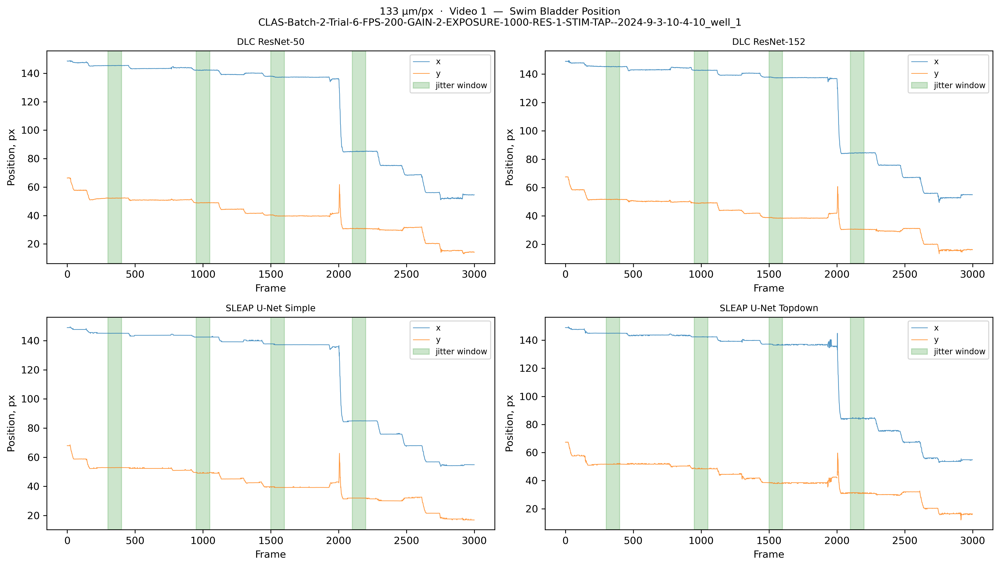

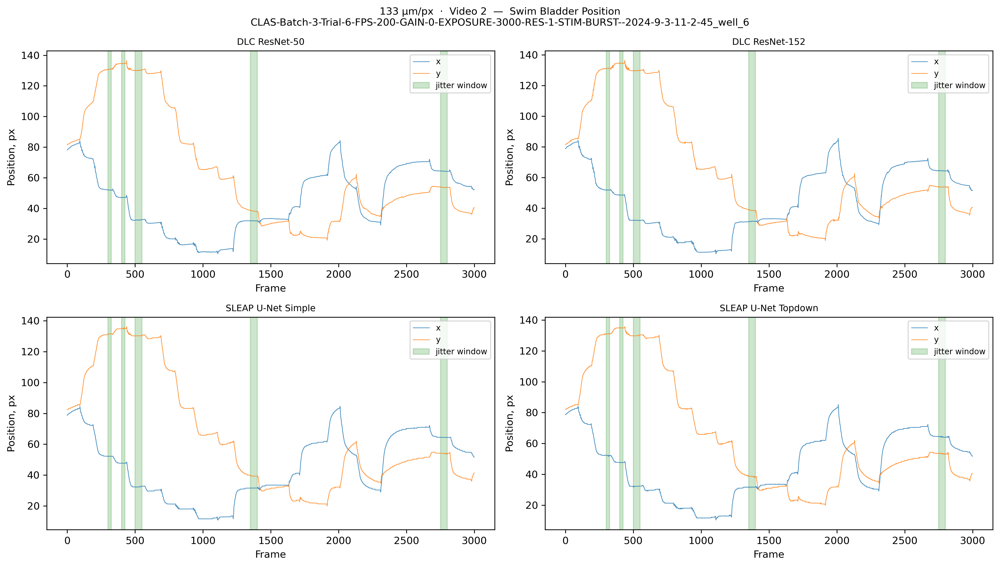

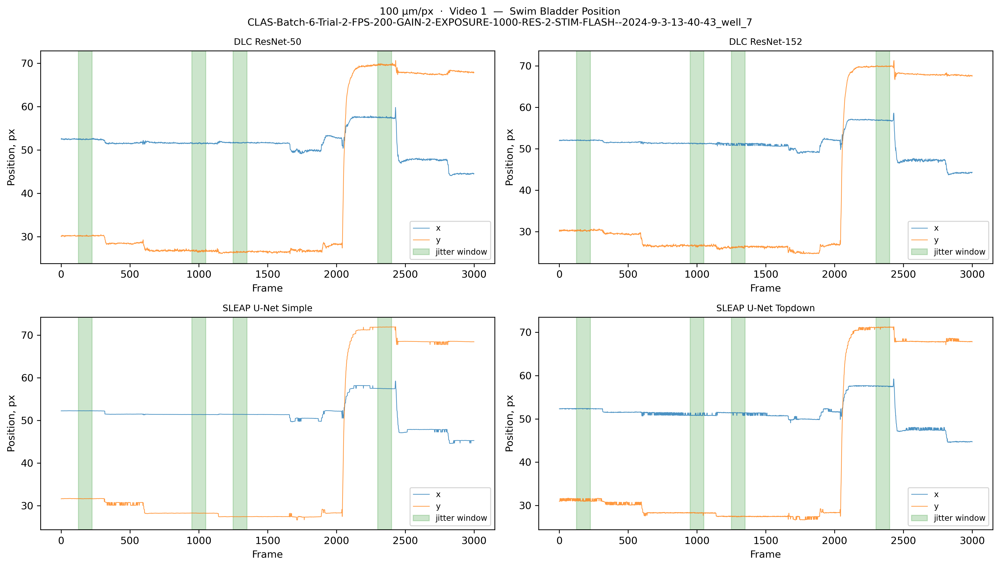

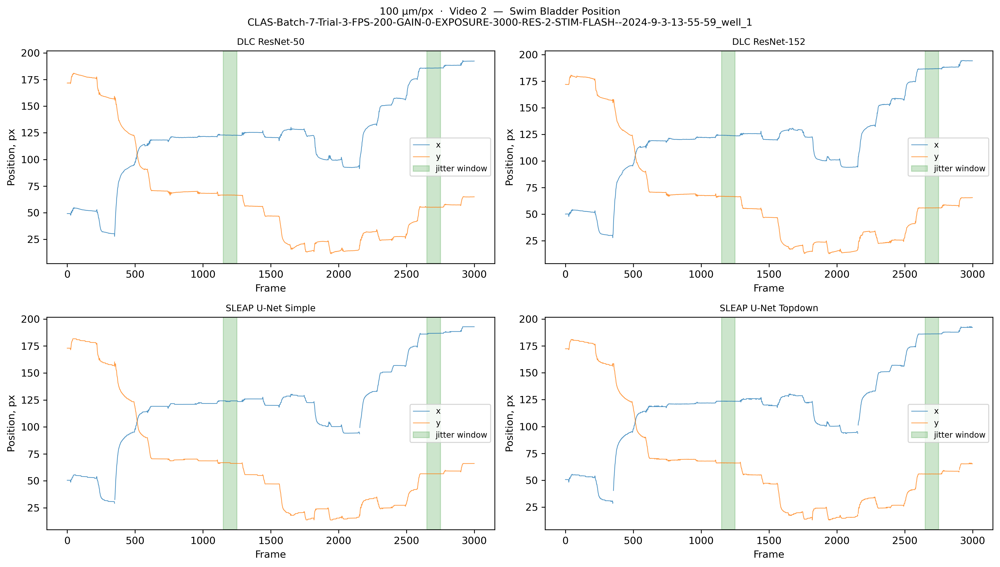

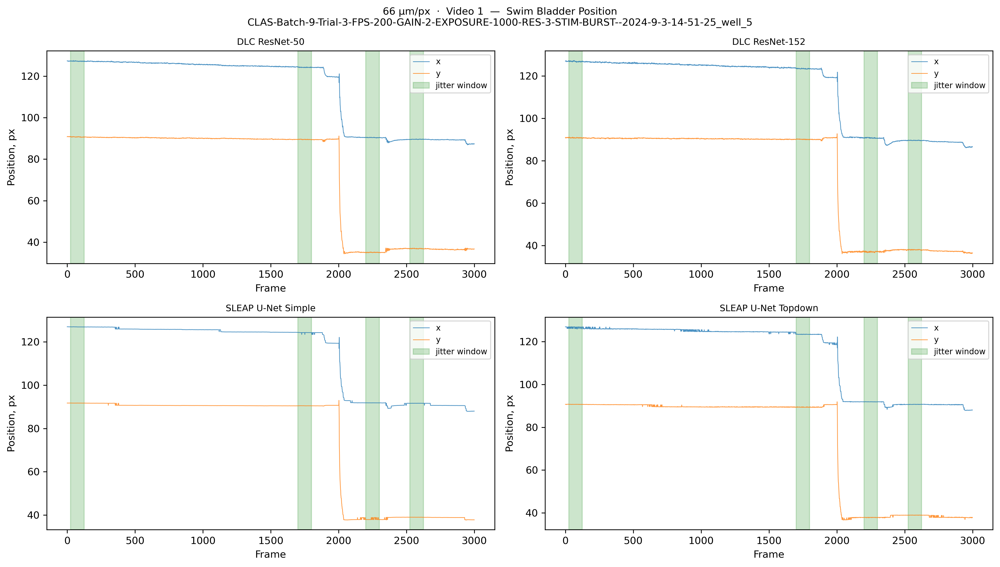

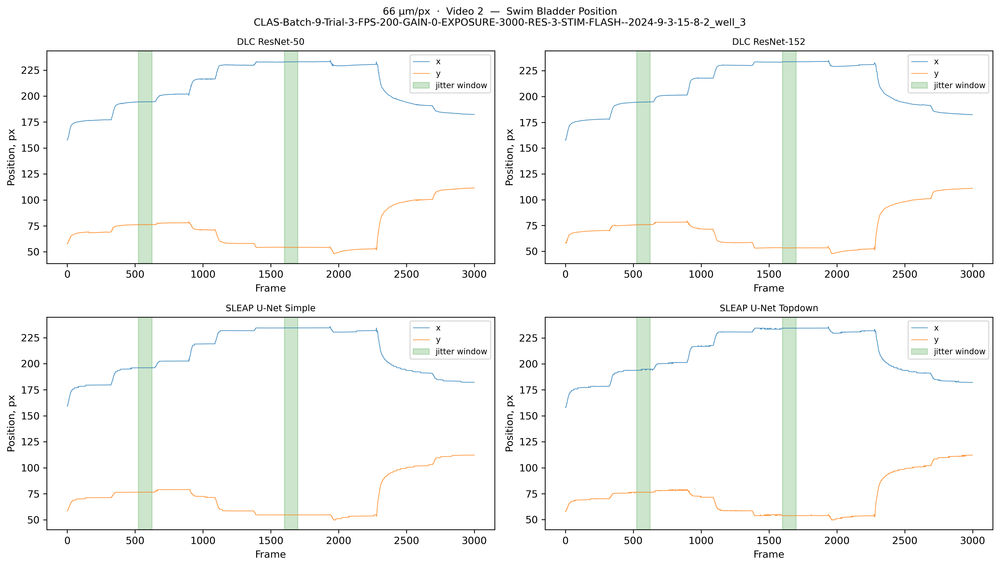

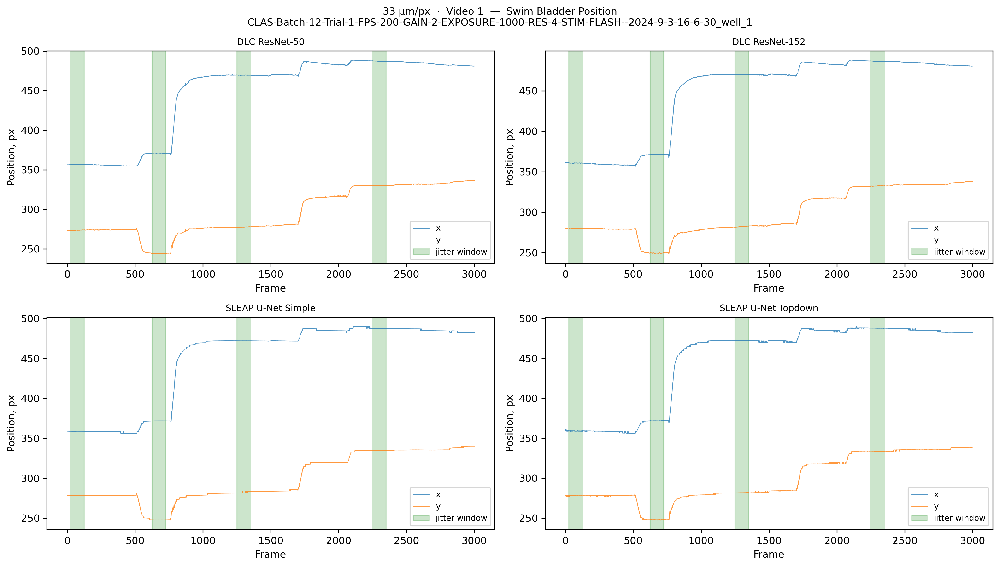

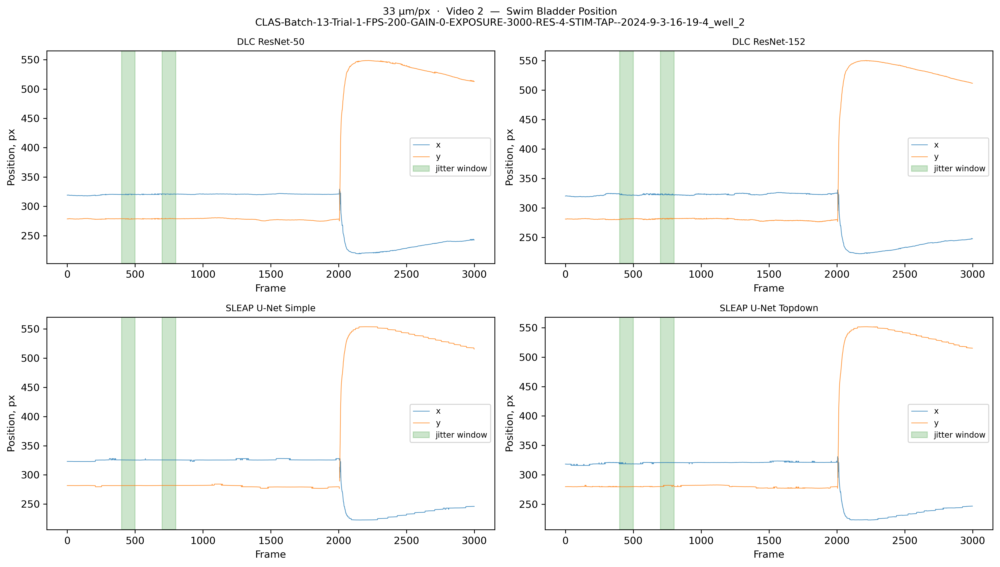

In [6]:
networks = list(pred_suffixes.keys())

for vi, (res, video_idx, video) in enumerate(zip(res_list, video_idx_list, videos_stem)):
    intervals = time_intervals[(res, video_idx)]
    video_name = Path(video).stem

    fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharey=False)
    fig.suptitle(f'{res_labels[res]}  ·  Video {video_idx + 1}  —  Swim Bladder Position\n{video_name}',
                 fontsize=10)
    axes = axes.flatten()

    res_mask  = tracking_outputs_df[('resolution', '')] == res
    vidx_mask = tracking_outputs_df[('video_idx', '')] == video_idx

    for ax, net in zip(axes, networks):
        net_mask = tracking_outputs_df[('network', '')] == net
        subset = tracking_outputs_df[res_mask & vidx_mask & net_mask]

        ax.plot(subset.index, subset[('swim_bladder', 'x')], label='x', alpha=0.8, linewidth=0.7)
        ax.plot(subset.index, subset[('swim_bladder', 'y')], label='y', alpha=0.8, linewidth=0.7)

        for i, interval in enumerate(intervals):
            ax.axvspan(interval[0], interval[1], alpha=0.2, color='green',
                       label='jitter window' if i == 0 else None)

        ax.set_title(net, fontsize=9)
        ax.set_xlabel('Frame')
        ax.set_ylabel('Position, px')
        ax.legend(fontsize=8)

    plt.tight_layout()
    plt.show()


**Figure S1.** Swim bladder x (horizontal) and y (vertical) pixel coordinates across all recorded frames for each of the four networks. Each panel corresponds to one of the eight videos (two per resolution setting, ordered from lowest to highest resolution). Green shaded regions mark the manually annotated stationary intervals used for jitter quantification.

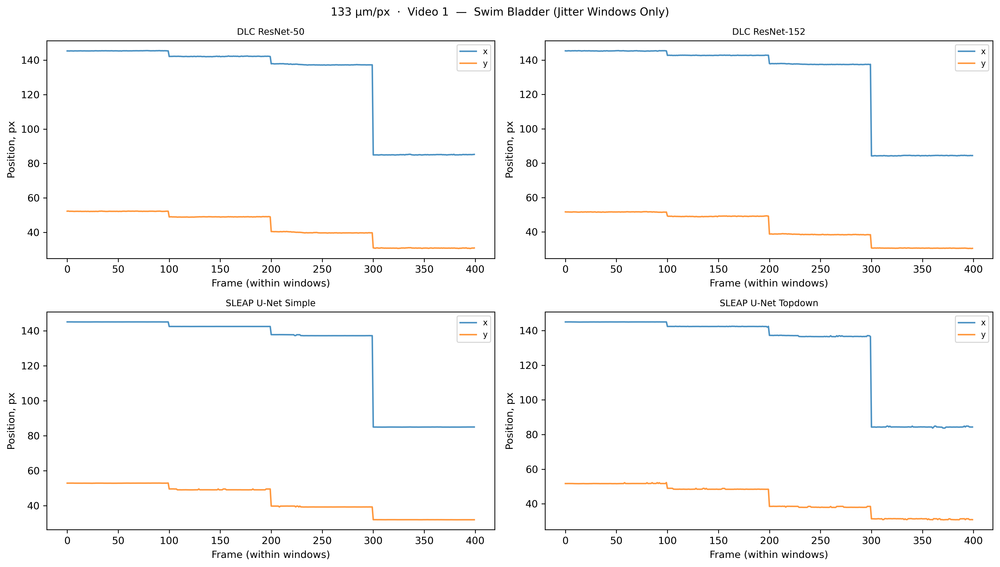

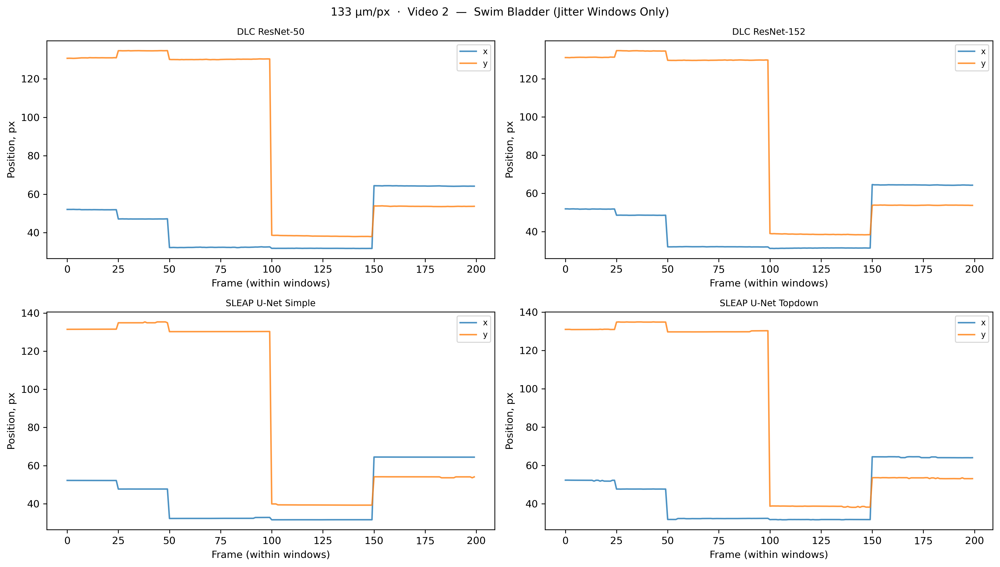

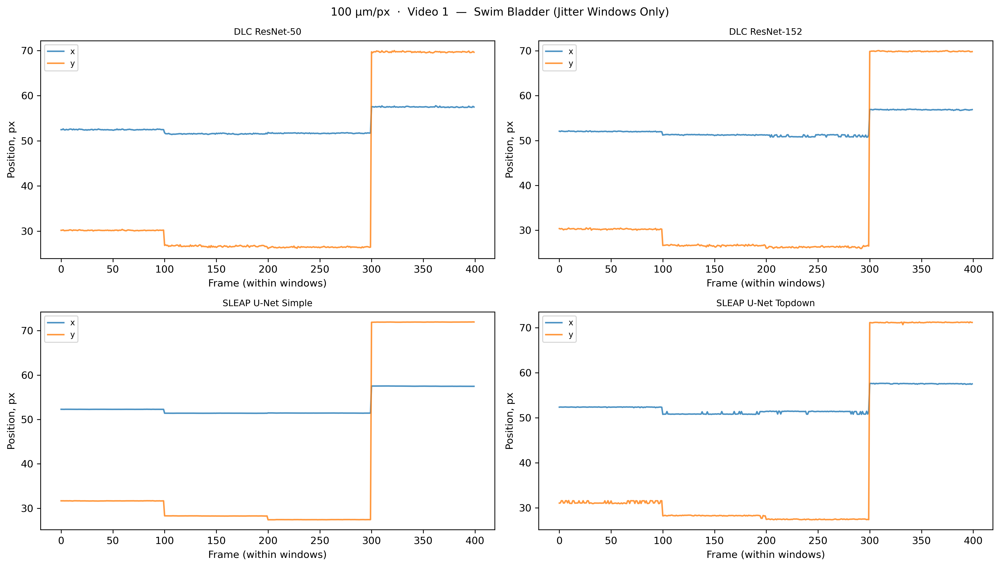

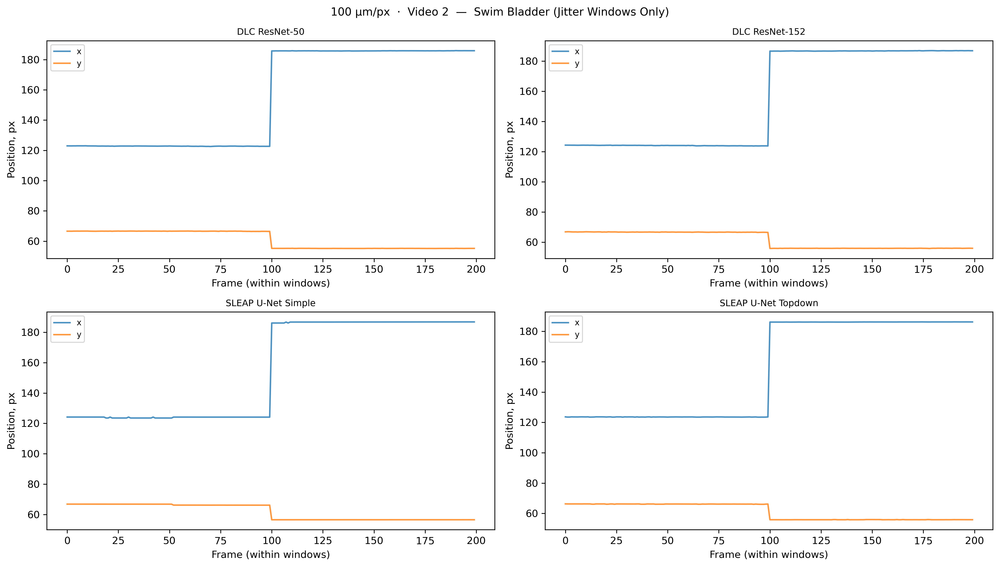

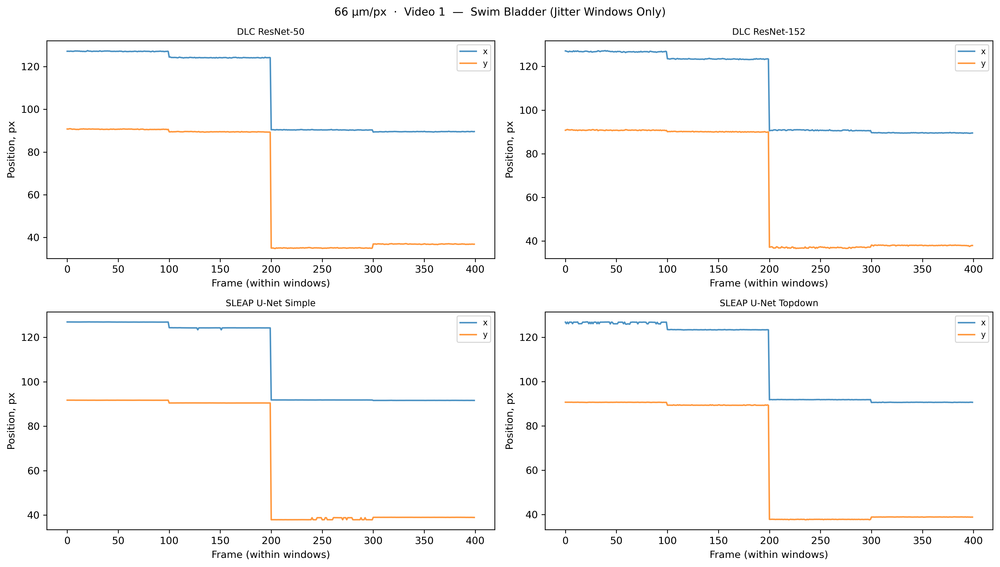

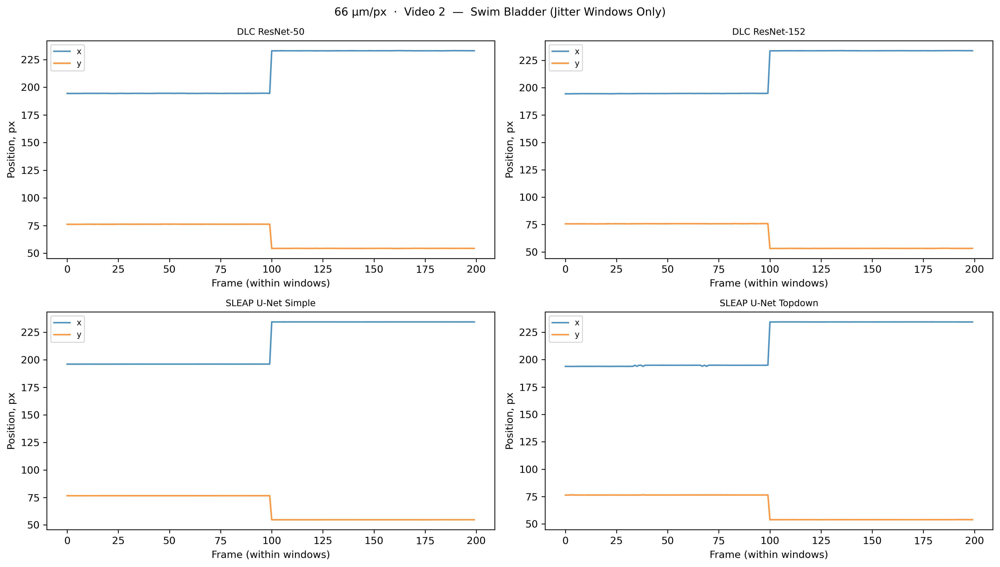

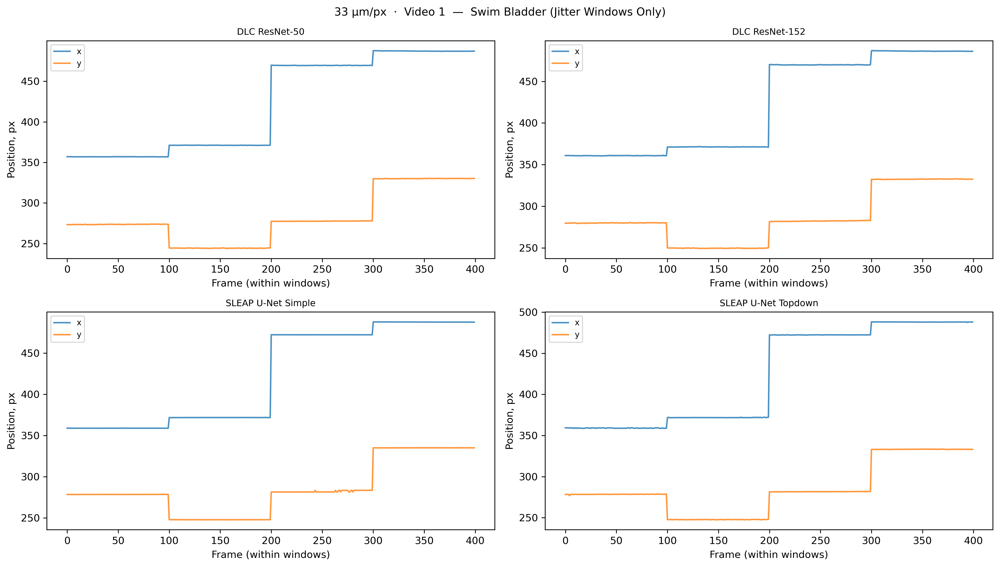

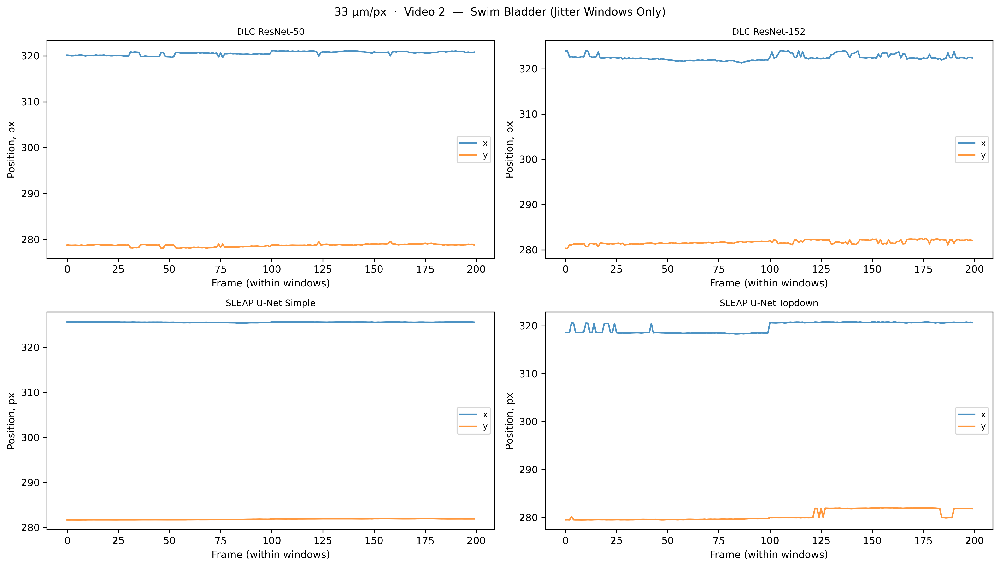

In [7]:
for vi, (res, video_idx) in enumerate(zip(res_list, video_idx_list)):
    intervals = time_intervals[(res, video_idx)]
    if not intervals:
        continue  # skip until windows are annotated for this video

    fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharey=False)
    fig.suptitle(f'{res_labels[res]}  ·  Video {video_idx + 1}  —  Swim Bladder (Jitter Windows Only)',
                 fontsize=11)
    axes = axes.flatten()

    res_mask  = tracking_outputs_df[('resolution', '')] == res
    vidx_mask = tracking_outputs_df[('video_idx', '')] == video_idx

    for ax, net in zip(axes, networks):
        net_mask = tracking_outputs_df[('network', '')] == net
        subset = tracking_outputs_df[res_mask & vidx_mask & net_mask]

        in_window = np.zeros(len(subset), dtype=bool)
        for start, end in intervals:
            in_window |= (subset.index >= start) & (subset.index < end)
        subset = subset[in_window]

        ax.plot(np.arange(len(subset)), subset[('swim_bladder', 'x')], label='x', alpha=0.8)
        ax.plot(np.arange(len(subset)), subset[('swim_bladder', 'y')], label='y', alpha=0.8)

        ax.set_title(net, fontsize=9)
        ax.set_xlabel('Frame (within windows)')
        ax.set_ylabel('Position, px')
        ax.legend(fontsize=8)

    plt.tight_layout()
    plt.show()


**Figure S2.** Swim bladder position restricted to the stationary intervals from Figure S1, with frames from different windows concatenated. The near-constant traces confirm that the fish was not moving during the selected frames.

### Jitter for the swim bladder

In [8]:
def pooled_std(series_list):
    """Std of tracking jitter across multiple stationary windows.
    Demeans each window separately before concatenating, so the global std
    reflects within-window spread only and is not inflated by the fish being
    at different positions across windows.
    """
    demeaned = pd.concat([s - s.mean() for s in series_list])
    return demeaned.std()


variance_records = []

for res in range(1, 5):
    res_mask = tracking_outputs_df[('resolution', '')] == res

    for net in networks:
        net_mask = tracking_outputs_df[('network', '')] == net

        windows_x, windows_y = [], []
        for video_idx in range(2):
            vidx_mask = tracking_outputs_df[('video_idx', '')] == video_idx
            subset = tracking_outputs_df[res_mask & vidx_mask & net_mask]
            for start, end in time_intervals[(res, video_idx)]:
                windows_x.append(subset.loc[start:end - 1, ('swim_bladder', 'x')])
                windows_y.append(subset.loc[start:end - 1, ('swim_bladder', 'y')])

        if windows_x:
            variance_records.append({
                'resolution': res,
                'network': net,
                'std_x': pooled_std(windows_x),
                'std_y': pooled_std(windows_y),
            })

jitter_df = pd.DataFrame(variance_records)
jitter_df


,resolution,network,std_x,std_y
0,1,DLC ResNet-50,0.125880,0.150098
1,1,DLC ResNet-152,0.105140,0.114737
2,1,SLEAP U-Net Simple,0.116480,0.142375
3,1,SLEAP U-Net Topdown,0.170506,0.204489
4,2,DLC ResNet-50,0.071072,0.085621
5,2,DLC ResNet-152,0.124396,0.096364
6,2,SLEAP U-Net Simple,0.137173,0.136073
7,2,SLEAP U-Net Topdown,0.123753,0.123381
8,3,DLC ResNet-50,0.069458,0.073636
9,3,DLC ResNet-152,0.123455,0.118123


In [9]:
# Build long-format DataFrame of per-frame deviations from each window's mean
deviation_records = []

for res in range(1, 5):
    res_mask = tracking_outputs_df[('resolution', '')] == res
    for net in networks:
        net_mask = tracking_outputs_df[('network', '')] == net
        for video_idx in range(2):
            vidx_mask = tracking_outputs_df[('video_idx', '')] == video_idx
            subset = tracking_outputs_df[res_mask & vidx_mask & net_mask]

            for start, end in time_intervals[(res, video_idx)]:
                window = subset.loc[start:end - 1]
                dx = window[('swim_bladder', 'x')] - window[('swim_bladder', 'x')].mean()
                dy = window[('swim_bladder', 'y')] - window[('swim_bladder', 'y')].mean()
                for dxi, dyi in zip(dx, dy):
                    deviation_records.append({
                        'resolution': res,
                        'network': net,
                        'dx': dxi,
                        'dy': dyi,
                        'euclidean_deviation': np.sqrt(dxi**2 + dyi**2),
                    })

deviation_df = pd.DataFrame(deviation_records)
deviation_df.head()


,resolution,network,dx,dy,euclidean_deviation
0,1,DLC ResNet-50,-0.070637,0.060234,0.092831
1,1,DLC ResNet-50,-0.049763,0.142871,0.151290
2,1,DLC ResNet-50,-0.110096,-0.000779,0.110099
3,1,DLC ResNet-50,-0.030338,0.014587,0.033663
4,1,DLC ResNet-50,-0.045261,0.008731,0.046096


C:\Users\lscholz\AppData\Local\Temp\ipykernel_117360\3704605781.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


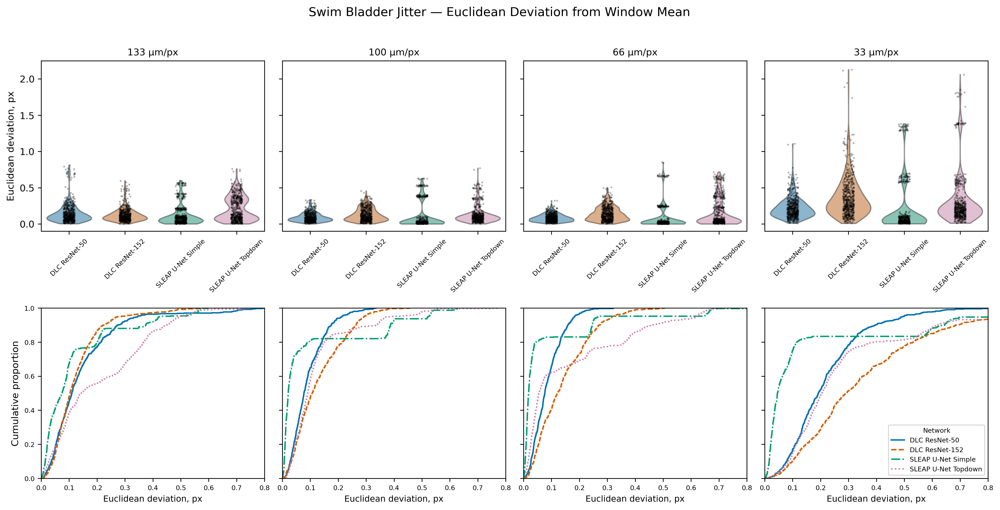

In [10]:
# Okabe-Ito palette: colorblind-safe and distinct in grayscale
palette    = ['#0072B2', '#D55E00', '#009E73', '#CC79A7']
linestyles = ['-',       '--',      '-.',       ':']

fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey='row',
                         gridspec_kw={'hspace': 0.45, 'wspace': 0.08})
fig.suptitle('Swim Bladder Jitter — Euclidean Deviation from Window Mean', fontsize=13)

for ri, res in enumerate(range(1, 5)):
    ax_v = axes[0, ri]
    ax_e = axes[1, ri]
    subset = deviation_df[deviation_df['resolution'] == res]

    # --- Row 0: violin + strip ---
    sns.violinplot(data=subset, x='network', y='euclidean_deviation', ax=ax_v,
                   order=networks, inner=None, alpha=0.5, cut=0, hue='network', palette=palette)
    sns.stripplot(data=subset, x='network', y='euclidean_deviation', ax=ax_v,
                  order=networks, size=2, alpha=0.3, jitter=True, color='black')
    ax_v.set_title(res_labels[res], fontsize=10)
    ax_v.set_xlabel('')
    ax_v.set_ylabel('Euclidean deviation, px' if ri == 0 else '')
    ax_v.tick_params(axis='x', rotation=45, labelsize=7)
    if ri > 0:
        plt.setp(ax_v.get_yticklabels(), visible=False)

    # --- Row 1: ECDF — different linestyle per network for B&W ---
    for net, ls, color in zip(networks, linestyles, palette):
        sns.ecdfplot(data=subset[subset['network'] == net], x='euclidean_deviation',
                     ax=ax_e, color=color, linestyle=ls, linewidth=1.5, label=net)
    ax_e.set_xlabel('Euclidean deviation, px', fontsize=9)
    ax_e.set_ylabel('Cumulative proportion' if ri == 0 else '')
    ax_e.tick_params(labelsize=7)
    if ri > 0:
        plt.setp(ax_e.get_yticklabels(), visible=False)
    if ri == 3:
        ax_e.legend(title='Network', fontsize=7, title_fontsize=7, loc='lower right')
    elif ax_e.get_legend():
        ax_e.get_legend().remove()

for i in range(4):
    axes[1, i].set_xlim(0, 0.8)
    axes[0, i].set_ylim(-0.1, 2.25)

plt.tight_layout()
plt.show()


**Figure 1.** Distribution of per-frame Euclidean deviation of the swim bladder from each window's mean position, pooled across all stationary intervals and both videos per resolution. Top row: violin plots with individual data points overlaid. Bottom row: empirical cumulative distribution functions (ECDFs); line styles distinguish networks for grayscale readability. The x-axis is capped at 0.8 px to aid comparison across resolutions.

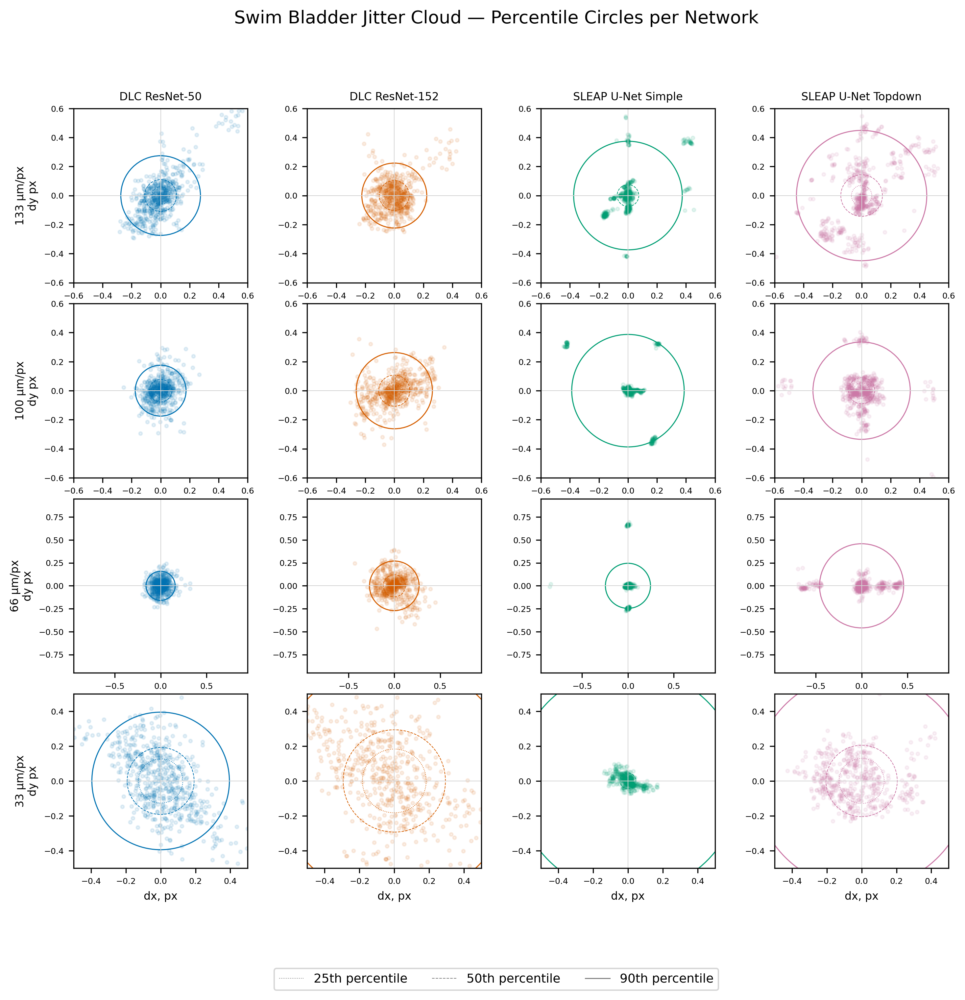

In [11]:
from matplotlib.lines import Line2D

# Okabe-Ito palette — consistent with violin/ECDF cells
palette    = ['#0072B2', '#D55E00', '#009E73', '#CC79A7']
net_colors = dict(zip(networks, palette))

percentiles    = [25,   50,   90]
pct_linestyles = [':',  '--', '-' ]
pct_linewidths = [0.5,  0.5,  0.75]
lim = [0.6, 0.6, 0.95, 0.5]

fig, axes = plt.subplots(4, 4, figsize=(12, 10), sharex=False, sharey=False,
                         gridspec_kw={'hspace': 0.12, 'wspace': 0.08})
fig.suptitle('Swim Bladder Jitter Cloud — Percentile Circles per Network', fontsize=13)

for ri, res in enumerate(range(1, 5)):
    for ci, net in enumerate(networks):
        ax = axes[ri, ci]
        net_data = deviation_df[(deviation_df['resolution'] == res) &
                                (deviation_df['network'] == net)]
        color = net_colors[net]

        ax.scatter(net_data['dx'], net_data['dy'],
                   color=color, alpha=0.1, s=6, zorder=1)
        for p, ls, lw in zip(percentiles, pct_linestyles, pct_linewidths):
            r = np.percentile(net_data['euclidean_deviation'], p)
            ax.add_patch(plt.Circle((0, 0), r, fill=False, edgecolor=color,
                                    linestyle=ls, linewidth=lw, zorder=2))

        ax.axhline(0, color='lightgray', linewidth=0.5)
        ax.axvline(0, color='lightgray', linewidth=0.5)
        ax.set_xlim(-lim[ri], lim[ri])
        ax.set_ylim(-lim[ri], lim[ri])
        ax.set_aspect('equal', adjustable='box')
        ax.tick_params(labelsize=6)

        if ri == 0:
            ax.set_title(net, fontsize=8)
        if ci == 0:
            ax.set_ylabel(f'{res_labels[res]}\ndy px', fontsize=8)
        else:
            ax.set_ylabel('')
        if ri == 3:
            ax.set_xlabel('dx, px', fontsize=8)

pct_handles = [Line2D([0], [0], color='gray', linestyle=ls, linewidth=lw,
                      label=f'{p}th percentile')
               for p, ls, lw in zip(percentiles, pct_linestyles, pct_linewidths)]
fig.legend(handles=pct_handles, fontsize=9, loc='lower center',
           ncol=3, bbox_to_anchor=(0.5, -0.02))

plt.show()


**Figure 2.** Two-dimensional scatter of per-frame position deviations (dx, dy) from each window mean for the swim bladder, with all points re-centred at the origin. Concentric circles mark the 25th, 50th, and 90th percentile of the Euclidean deviation. Each column corresponds to one network; rows correspond to resolution settings. Axis limits are held constant within each row to allow direct cross-network comparison.

C:\Users\lscholz\AppData\Local\Temp\ipykernel_117360\3376136648.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


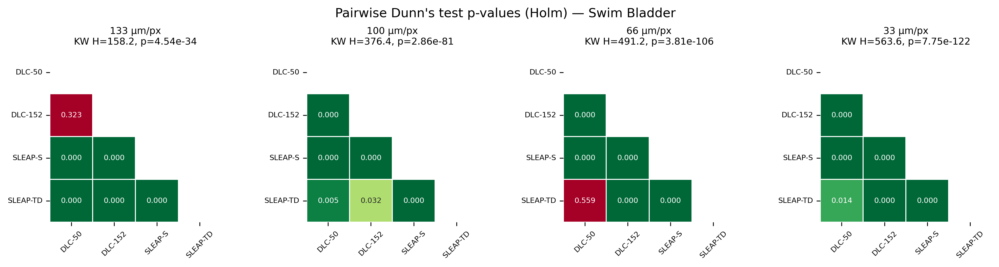

In [12]:
# Kruskal-Wallis + Dunn's test (Holm correction) on swim_bladder euclidean deviation
short_names = ['DLC-50', 'DLC-152', 'SLEAP-S', 'SLEAP-TD']

fig, axes = plt.subplots(1, 4, figsize=(16, 3.5), gridspec_kw={'wspace': 0.5})
fig.suptitle("Pairwise Dunn's test p-values (Holm) — Swim Bladder", fontsize=12)

for ri, res in enumerate(range(1, 5)):
    ax = axes[ri]
    subset = deviation_df[deviation_df['resolution'] == res]

    groups = [subset[subset['network'] == net]['euclidean_deviation'].values for net in networks]
    stat, p = kruskal(*groups)

    dunn = (posthoc_dunn(subset, val_col='euclidean_deviation', group_col='network', p_adjust='holm')
            .reindex(index=networks, columns=networks))
    dunn.index = short_names
    dunn.columns = short_names

    mask = np.triu(np.ones(dunn.shape, dtype=bool))
    sns.heatmap(dunn, ax=ax, mask=mask, cmap='RdYlGn_r', vmin=0, vmax=0.1,
                annot=True, fmt='.3f', annot_kws={'size': 7},
                linewidths=0.5, square=True, cbar=False)
    ax.set_title(f'{res_labels[res]}\nKW H={stat:.1f}, p={p:.2e}', fontsize=9)
    ax.tick_params(axis='x', rotation=45, labelsize=7)
    ax.tick_params(axis='y', rotation=0, labelsize=7)

plt.tight_layout()
plt.show()


**Figure 3.** Pairwise Dunn's test p-values (Holm correction) for swim bladder Euclidean deviation between all pairs of networks within each resolution. Panel titles report the Kruskal-Wallis H statistic and omnibus p-value. Colour ranges from red (p ≈ 0, significant) to green (p ≥ 0.1, non-significant); values below 0.05 indicate a statistically significant pairwise difference.

### Jitter for the 10th tail segment

In [13]:
variance_records = []

for res in range(1, 5):
    res_mask = tracking_outputs_df[('resolution', '')] == res

    for net in networks:
        net_mask = tracking_outputs_df[('network', '')] == net

        windows_x, windows_y = [], []
        for video_idx in range(2):
            vidx_mask = tracking_outputs_df[('video_idx', '')] == video_idx
            subset = tracking_outputs_df[res_mask & vidx_mask & net_mask]
            for start, end in time_intervals[(res, video_idx)]:
                windows_x.append(subset.loc[start:end - 1, ('tail_10', 'x')])
                windows_y.append(subset.loc[start:end - 1, ('tail_10', 'y')])

        if windows_x:
            variance_records.append({
                'resolution': res,
                'network': net,
                'std_x': pooled_std(windows_x),
                'std_y': pooled_std(windows_y),
            })

jitter_df = pd.DataFrame(variance_records)
jitter_df


,resolution,network,std_x,std_y
0,1,DLC ResNet-50,0.293524,0.319687
1,1,DLC ResNet-152,0.284233,0.339985
2,1,SLEAP U-Net Simple,0.302223,0.280392
3,1,SLEAP U-Net Topdown,0.300302,0.235065
4,2,DLC ResNet-50,0.356632,0.496538
5,2,DLC ResNet-152,0.329653,0.427537
6,2,SLEAP U-Net Simple,0.312939,0.437008
7,2,SLEAP U-Net Topdown,0.576595,0.361721
8,3,DLC ResNet-50,0.440494,0.390420
9,3,DLC ResNet-152,0.387011,0.374669


In [14]:
# Build long-format DataFrame of per-frame deviations from each window's mean
deviation_records = []

for res in range(1, 5):
    res_mask = tracking_outputs_df[('resolution', '')] == res
    for net in networks:
        net_mask = tracking_outputs_df[('network', '')] == net
        for video_idx in range(2):
            vidx_mask = tracking_outputs_df[('video_idx', '')] == video_idx
            subset = tracking_outputs_df[res_mask & vidx_mask & net_mask]

            for start, end in time_intervals[(res, video_idx)]:
                window = subset.loc[start:end - 1]
                dx = window[('tail_10', 'x')] - window[('tail_10', 'x')].mean()
                dy = window[('tail_10', 'y')] - window[('tail_10', 'y')].mean()
                for dxi, dyi in zip(dx, dy):
                    deviation_records.append({
                        'resolution': res,
                        'network': net,
                        'dx': dxi,
                        'dy': dyi,
                        'euclidean_deviation': np.sqrt(dxi**2 + dyi**2),
                    })

deviation_df = pd.DataFrame(deviation_records)
deviation_df.head()


,resolution,network,dx,dy,euclidean_deviation
0,1,DLC ResNet-50,0.100177,-0.393335,0.405892
1,1,DLC ResNet-50,-0.031033,0.038366,0.049346
2,1,DLC ResNet-50,-0.402264,0.353857,0.535753
3,1,DLC ResNet-50,0.192478,-0.155985,0.247748
4,1,DLC ResNet-50,0.367252,-0.112535,0.384107


C:\Users\lscholz\AppData\Local\Temp\ipykernel_117360\2535631841.py:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


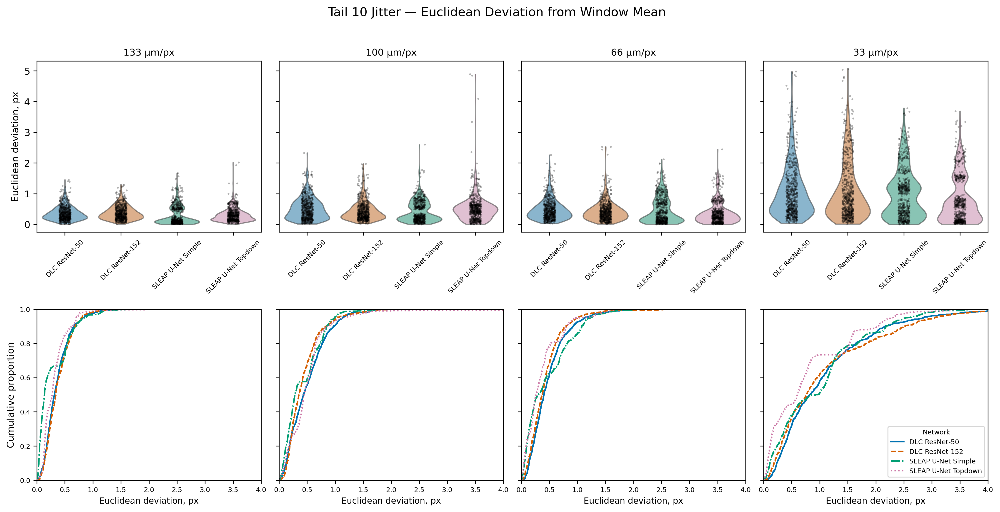

In [15]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey='row',
                         gridspec_kw={'hspace': 0.45, 'wspace': 0.08})
fig.suptitle('Tail 10 Jitter — Euclidean Deviation from Window Mean', fontsize=13)

for ri, res in enumerate(range(1, 5)):
    ax_v = axes[0, ri]
    ax_e = axes[1, ri]
    subset = deviation_df[deviation_df['resolution'] == res]

    sns.violinplot(data=subset, x='network', y='euclidean_deviation', ax=ax_v,
                   order=networks, inner=None, alpha=0.5, cut=0, hue='network', palette=palette)
    sns.stripplot(data=subset, x='network', y='euclidean_deviation', ax=ax_v,
                  order=networks, size=2, alpha=0.3, jitter=True, color='black')
    ax_v.set_title(res_labels[res], fontsize=10)
    ax_v.set_xlabel('')
    ax_v.set_ylabel('Euclidean deviation, px' if ri == 0 else '')
    ax_v.tick_params(axis='x', rotation=45, labelsize=7)
    if ri > 0:
        plt.setp(ax_v.get_yticklabels(), visible=False)

    for net, ls, color in zip(networks, linestyles, palette):
        sns.ecdfplot(data=subset[subset['network'] == net], x='euclidean_deviation',
                     ax=ax_e, color=color, linestyle=ls, linewidth=1.5, label=net)
    ax_e.set_xlabel('Euclidean deviation, px', fontsize=9)
    ax_e.set_ylabel('Cumulative proportion' if ri == 0 else '')
    ax_e.tick_params(labelsize=7)
    if ri > 0:
        plt.setp(ax_e.get_yticklabels(), visible=False)
    if ri == 3:
        ax_e.legend(title='Network', fontsize=7, title_fontsize=7, loc='lower right')
    elif ax_e.get_legend():
        ax_e.get_legend().remove()

for i in range(4):
    axes[1, i].set_xlim(0, 4)

plt.tight_layout()
plt.show()


**Figure 4.** Distribution of per-frame Euclidean deviation for tail_10, the most distal tracked tail segment. Layout identical to Figure 1. The larger deviations relative to the swim bladder reflect the greater positional uncertainty expected at the tip of a flexible structure.

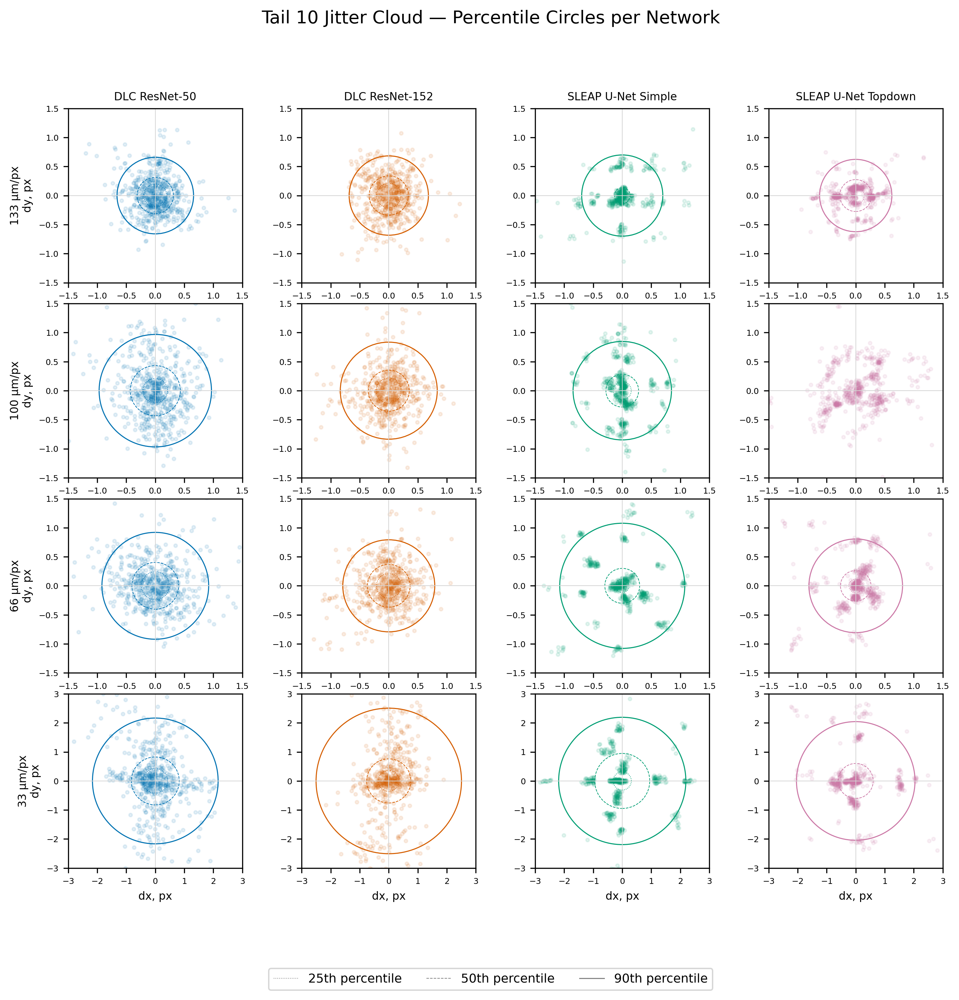

In [16]:
lim = [1.5, 1.5, 1.5, 3]

fig, axes = plt.subplots(4, 4, figsize=(12, 10), sharex=False, sharey=False,
                         gridspec_kw={'hspace': 0.12, 'wspace': 0.08})
fig.suptitle('Tail 10 Jitter Cloud — Percentile Circles per Network', fontsize=13)

for ri, res in enumerate(range(1, 5)):
    for ci, net in enumerate(networks):
        ax = axes[ri, ci]
        net_data = deviation_df[(deviation_df['resolution'] == res) &
                                (deviation_df['network'] == net)]
        color = net_colors[net]

        ax.scatter(net_data['dx'], net_data['dy'],
                   color=color, alpha=0.1, s=6, zorder=1)
        for p, ls, lw in zip(percentiles, pct_linestyles, pct_linewidths):
            r = np.percentile(net_data['euclidean_deviation'], p)
            ax.add_patch(plt.Circle((0, 0), r, fill=False, edgecolor=color,
                                    linestyle=ls, linewidth=lw, zorder=2))

        ax.axhline(0, color='lightgray', linewidth=0.5)
        ax.axvline(0, color='lightgray', linewidth=0.5)
        ax.set_xlim(-lim[ri], lim[ri])
        ax.set_ylim(-lim[ri], lim[ri])
        ax.set_aspect('equal', adjustable='box')
        ax.tick_params(labelsize=6)

        if ri == 0:
            ax.set_title(net, fontsize=8)
        if ci == 0:
            ax.set_ylabel(f'{res_labels[res]}\ndy, px', fontsize=8)
        else:
            ax.set_ylabel('')
        if ri == 3:
            ax.set_xlabel('dx, px', fontsize=8)

pct_handles = [Line2D([0], [0], color='gray', linestyle=ls, linewidth=lw,
                      label=f'{p}th percentile')
               for p, ls, lw in zip(percentiles, pct_linestyles, pct_linewidths)]
fig.legend(handles=pct_handles, fontsize=9, loc='lower center',
           ncol=3, bbox_to_anchor=(0.5, -0.02))

plt.show()


**Figure 5.** Two-dimensional deviation scatter and percentile circles for tail_10 (same format as Figure 2). Axis limits are wider than for the swim bladder to accommodate the larger spread characteristic of a distal tail keypoint.

C:\Users\lscholz\AppData\Local\Temp\ipykernel_117360\2685629564.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


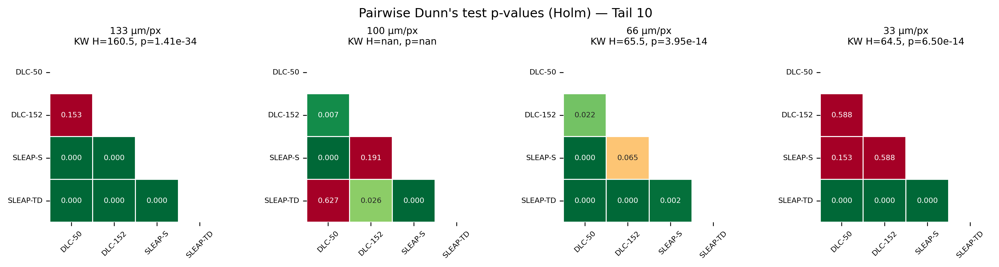

In [17]:
# Kruskal-Wallis + Dunn's test (Holm correction) on swim_bladder euclidean deviation
short_names = ['DLC-50', 'DLC-152', 'SLEAP-S', 'SLEAP-TD']

fig, axes = plt.subplots(1, 4, figsize=(16, 3.5), gridspec_kw={'wspace': 0.5})
fig.suptitle("Pairwise Dunn's test p-values (Holm) — Tail 10", fontsize=12)

for ri, res in enumerate(range(1, 5)):
    ax = axes[ri]
    subset = deviation_df[deviation_df['resolution'] == res]

    groups = [subset[subset['network'] == net]['euclidean_deviation'].values for net in networks]
    stat, p = kruskal(*groups)

    dunn = (posthoc_dunn(subset, val_col='euclidean_deviation', group_col='network', p_adjust='holm')
            .reindex(index=networks, columns=networks))
    dunn.index = short_names
    dunn.columns = short_names

    mask = np.triu(np.ones(dunn.shape, dtype=bool))
    sns.heatmap(dunn, ax=ax, mask=mask, cmap='RdYlGn_r', vmin=0, vmax=0.1,
                annot=True, fmt='.3f', annot_kws={'size': 7},
                linewidths=0.5, square=True, cbar=False)
    ax.set_title(f'{res_labels[res]}\nKW H={stat:.1f}, p={p:.2e}', fontsize=9)
    ax.tick_params(axis='x', rotation=45, labelsize=7)
    ax.tick_params(axis='y', rotation=0, labelsize=7)

plt.tight_layout()
plt.show()


**Figure 6.** Pairwise Dunn's test p-values (Holm correction) for tail_10 Euclidean deviation (same format as Figure 3). tail_10 was selected as a representative distal-tail keypoint where inter-network differences in tracking precision are expected to be largest.

## Pooled jitter for all keypoints

In [18]:
# Derive keypoint list from the column MultiIndex (excludes metadata columns)
keypoints = [col for col in tracking_outputs_df.columns.get_level_values(0).unique()
             if col not in ('resolution', 'network', 'video_idx')]

all_deviation_records = []
all_jitter_records = []

for res in range(1, 5):
    res_mask = tracking_outputs_df[('resolution', '')] == res
    for net in networks:
        net_mask = tracking_outputs_df[('network', '')] == net

        for kp in keypoints:
            windows_x, windows_y = [], []

            for video_idx in range(2):
                vidx_mask = tracking_outputs_df[('video_idx', '')] == video_idx
                subset = tracking_outputs_df[res_mask & vidx_mask & net_mask]

                for start, end in time_intervals[(res, video_idx)]:
                    windows_x.append(subset.loc[start:end - 1, (kp, 'x')])
                    windows_y.append(subset.loc[start:end - 1, (kp, 'y')])

                    window = subset.loc[start:end - 1]
                    dx = window[(kp, 'x')] - window[(kp, 'x')].mean()
                    dy = window[(kp, 'y')] - window[(kp, 'y')].mean()
                    for dxi, dyi in zip(dx, dy):
                        all_deviation_records.append({
                            'resolution': res, 'network': net, 'keypoint': kp,
                            'dx': dxi, 'dy': dyi,
                            'euclidean_deviation': np.sqrt(dxi**2 + dyi**2),
                        })

            if windows_x:
                all_jitter_records.append({
                    'resolution': res, 'network': net, 'keypoint': kp,
                    'std_x': pooled_std(windows_x),
                    'std_y': pooled_std(windows_y),
                })

all_deviation_df = pd.DataFrame(all_deviation_records)
all_jitter_df = pd.DataFrame(all_jitter_records)
all_jitter_df['std_euc'] = np.sqrt(all_jitter_df['std_x']**2 + all_jitter_df['std_y']**2)

print(f'Keypoints ({len(keypoints)}): {keypoints}')
print(f'all_deviation_df: {len(all_deviation_df):,} rows')
all_jitter_df.head(8)


Keypoints (15): ['swim_bladder', 'tail_1', 'tail_2', 'tail_3', 'tail_4', 'tail_5', 'tail_6', 'tail_7', 'tail_8', 'tail_9', 'tail_10', 'R_eye_top', 'R_eye_bottom', 'L_eye_top', 'L_eye_bottom']
all_deviation_df: 144,000 rows


,resolution,network,keypoint,std_x,std_y,std_euc
0,1,DLC ResNet-50,swim_bladder,0.125880,0.150098,0.195896
1,1,DLC ResNet-50,tail_1,0.149831,0.167425,0.224679
2,1,DLC ResNet-50,tail_2,0.157554,0.162267,0.226172
3,1,DLC ResNet-50,tail_3,0.163146,0.162617,0.230350
4,1,DLC ResNet-50,tail_4,0.192892,0.143342,0.240322
5,1,DLC ResNet-50,tail_5,0.196100,0.192877,0.275058
6,1,DLC ResNet-50,tail_6,0.220515,0.225283,0.315244
7,1,DLC ResNet-50,tail_7,0.214156,0.238659,0.320657


C:\Users\lscholz\AppData\Local\Temp\ipykernel_117360\968492926.py:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


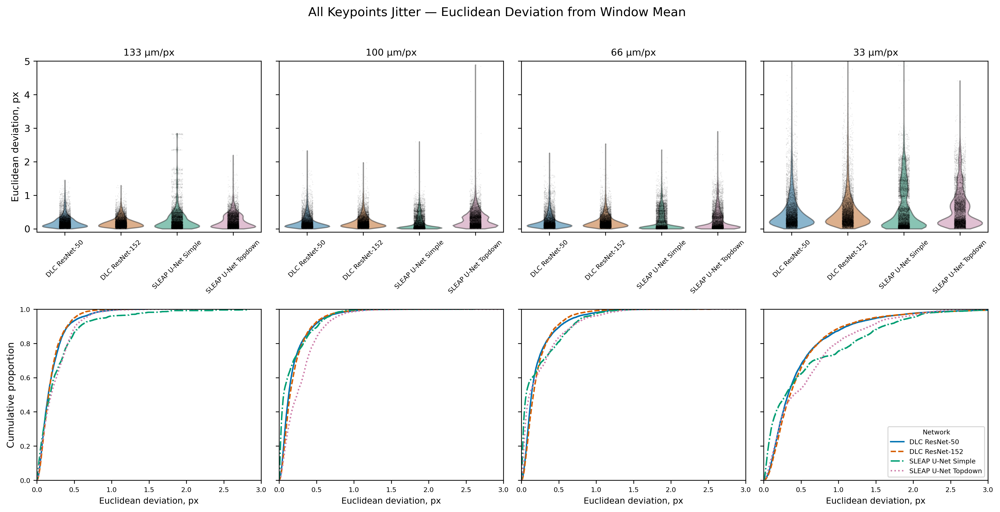

In [19]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey='row',
                         gridspec_kw={'hspace': 0.45, 'wspace': 0.08})
fig.suptitle('All Keypoints Jitter — Euclidean Deviation from Window Mean', fontsize=13)

for ri, res in enumerate(range(1, 5)):
    ax_v = axes[0, ri]
    ax_e = axes[1, ri]
    subset = all_deviation_df[all_deviation_df['resolution'] == res]

    sns.violinplot(data=subset, x='network', y='euclidean_deviation', ax=ax_v,
                   order=networks, inner=None, alpha=0.5, cut=0, hue='network', palette=palette)
    sns.stripplot(data=subset, x='network', y='euclidean_deviation', ax=ax_v,
                  order=networks, size=1, alpha=0.08, jitter=True, color='black')
    ax_v.set_title(res_labels[res], fontsize=10)
    ax_v.set_xlabel('')
    ax_v.set_ylabel('Euclidean deviation, px' if ri == 0 else '')
    ax_v.tick_params(axis='x', rotation=45, labelsize=7)
    if ri > 0:
        plt.setp(ax_v.get_yticklabels(), visible=False)

    for net, ls, color in zip(networks, linestyles, palette):
        sns.ecdfplot(data=subset[subset['network'] == net], x='euclidean_deviation',
                     ax=ax_e, color=color, linestyle=ls, linewidth=1.5, label=net)
    ax_e.set_xlabel('Euclidean deviation, px', fontsize=9)
    ax_e.set_ylabel('Cumulative proportion' if ri == 0 else '')
    ax_e.tick_params(labelsize=7)
    if ri > 0:
        plt.setp(ax_e.get_yticklabels(), visible=False)
    if ri == 3:
        ax_e.legend(title='Network', fontsize=7, title_fontsize=7, loc='lower right')
    elif ax_e.get_legend():
        ax_e.get_legend().remove()

for i in range(4):
    axes[1, i].set_xlim(0, 3)
    axes[0, i].set_ylim(-0.1, 5)
plt.tight_layout()
plt.show()


**Figure 7.** Distribution of per-frame Euclidean deviation pooled across all 15 keypoints for each network and resolution (same layout as Figure 1). The 15-fold increase in data points relative to Figure 1 provides higher statistical power to detect differences in overall tracking consistency. The x-axis is capped at 3 px to accommodate the larger spread of distal tail keypoints.

C:\Users\lscholz\AppData\Local\Temp\ipykernel_117360\2050172674.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


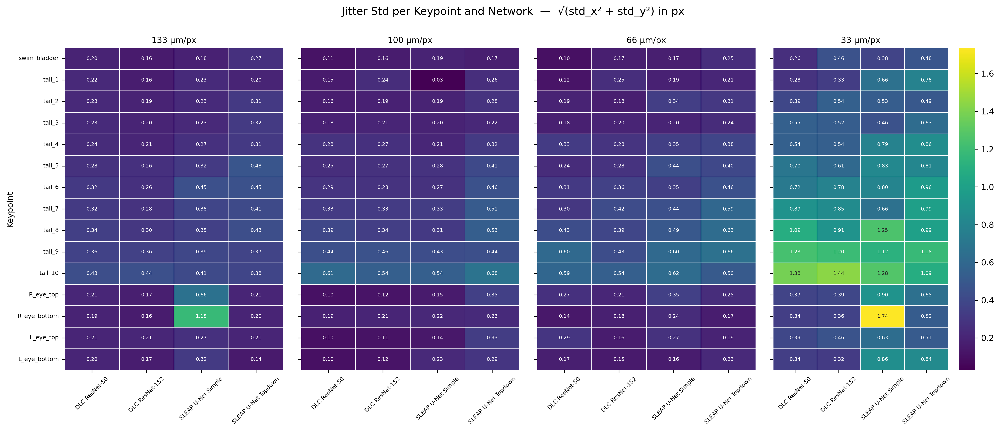

In [20]:
# Heatmap: std_euc (√(std_x²+std_y²)) per keypoint × network, one panel per resolution
# Consistent color scale across all resolutions for direct comparison
vmin = all_jitter_df['std_euc'].min()
vmax = all_jitter_df['std_euc'].max()

fig, axes = plt.subplots(1, 4, figsize=(20, 7), gridspec_kw={'wspace': 0.08})
fig.suptitle('Jitter Std per Keypoint and Network  —  √(std_x² + std_y²) in px', fontsize=13)

for ri, res in enumerate(range(1, 5)):
    ax = axes[ri]
    pivot = (all_jitter_df[all_jitter_df['resolution'] == res]
             .pivot(index='keypoint', columns='network', values='std_euc')
             .reindex(index=keypoints, columns=networks))

    sns.heatmap(pivot, ax=ax, cmap='viridis', vmin=vmin, vmax=vmax,
                cbar=ri == 3, annot=True, fmt='.2f',
                annot_kws={'size': 6}, linewidths=0.3)
    ax.set_title(res_labels[res], fontsize=10)
    ax.set_xlabel('')
    ax.set_ylabel('Keypoint' if ri == 0 else '')
    ax.tick_params(axis='x', rotation=45, labelsize=7)
    ax.tick_params(axis='y', rotation=0, labelsize=7)
    if ri > 0:
        ax.set_yticklabels([])

plt.tight_layout()
plt.show()


**Figure 8.** Heatmap of pooled jitter magnitude (√(σ_x² + σ_y²), px) per keypoint and network, computed from the pooled standard deviation across all stationary windows. A single colour scale is shared across all four resolution panels to allow direct comparison. Keypoints are ordered from body centre (swim_bladder) through the tail to eye points.

C:\Users\lscholz\AppData\Local\Temp\ipykernel_117360\1162387353.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


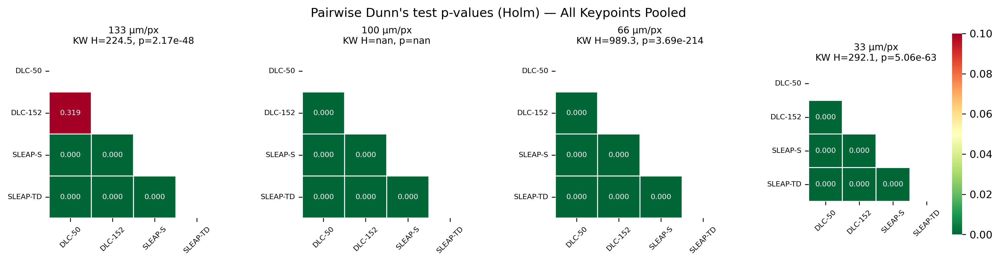

In [21]:
# Kruskal-Wallis + Dunn's test (Holm correction) — all keypoints pooled
short_names = ['DLC-50', 'DLC-152', 'SLEAP-S', 'SLEAP-TD']

fig, axes = plt.subplots(1, 4, figsize=(16, 3.5), gridspec_kw={'wspace': 0.5})
fig.suptitle("Pairwise Dunn's test p-values (Holm) — All Keypoints Pooled", fontsize=12)

for ri, res in enumerate(range(1, 5)):
    ax = axes[ri]
    subset = all_deviation_df[all_deviation_df['resolution'] == res]

    groups = [subset[subset['network'] == net]['euclidean_deviation'].values for net in networks]
    stat, p = kruskal(*groups)

    dunn = (posthoc_dunn(subset, val_col='euclidean_deviation', group_col='network', p_adjust='holm')
            .reindex(index=networks, columns=networks))
    dunn.index = short_names
    dunn.columns = short_names

    mask = np.triu(np.ones(dunn.shape, dtype=bool))
    sns.heatmap(dunn, ax=ax, mask=mask, cmap='RdYlGn_r', vmin=0, vmax=0.1,
                annot=True, fmt='.3f', annot_kws={'size': 7},
                linewidths=0.5, square=True, cbar=ri == 3)
    ax.set_title(f'{res_labels[res]}\nKW H={stat:.1f}, p={p:.2e}', fontsize=9)
    ax.tick_params(axis='x', rotation=45, labelsize=7)
    ax.tick_params(axis='y', rotation=0, labelsize=7)

plt.tight_layout()
plt.show()


**Figure 9.** Pairwise Dunn's test p-values (Holm correction) on Euclidean deviation pooled across all 15 keypoints (same format as Figure 3). Pooling across keypoints provides the highest-power comparison of overall inter-network tracking consistency within each resolution.